### Line Charts

In [1]:
import plotly
import plotly.express as px
import pandas as pd
import plotly.io as pio
pio.templates.default = 'plotly_white'

In [2]:
# creating the data frame
df_stocks = px.data.stocks()

# taking a look at the data frame
df_stocks

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708
...,...,...,...,...,...,...,...
100,2019-12-02,1.216280,1.546914,1.425061,1.075997,1.463641,1.720717
101,2019-12-09,1.222821,1.572286,1.432660,1.038855,1.421496,1.752239
102,2019-12-16,1.224418,1.596800,1.453455,1.104094,1.604362,1.784896
103,2019-12-23,1.226504,1.656000,1.521226,1.113728,1.567170,1.802472


### Base Line Chart

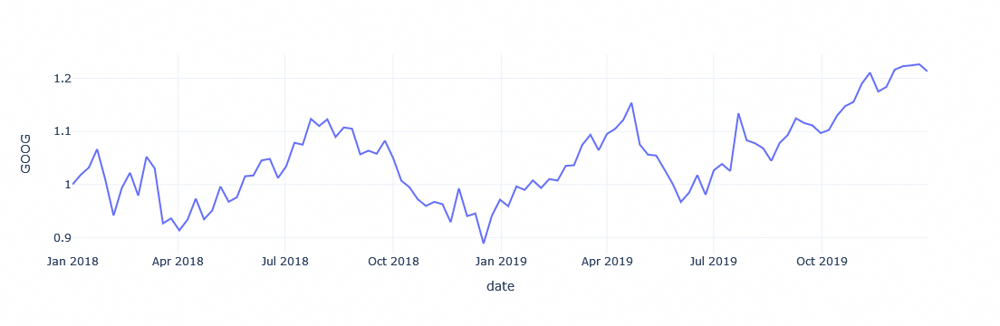

In [3]:
# creating the line chart
line = px.line(df_stocks, x = 'date', y = 'GOOG')

# remdering the chart
line.show()

### Area chart (not super important)

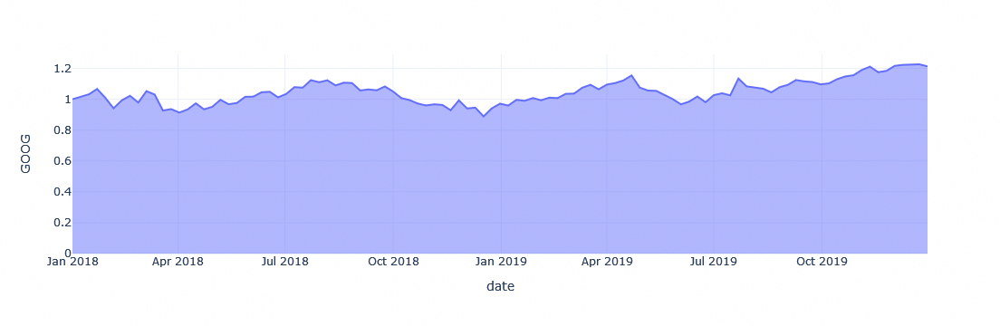

In [4]:
# creating the line chart
line = px.area(df_stocks, x = 'date', y = 'GOOG')

# remdering the chart
line.show()

### Markers

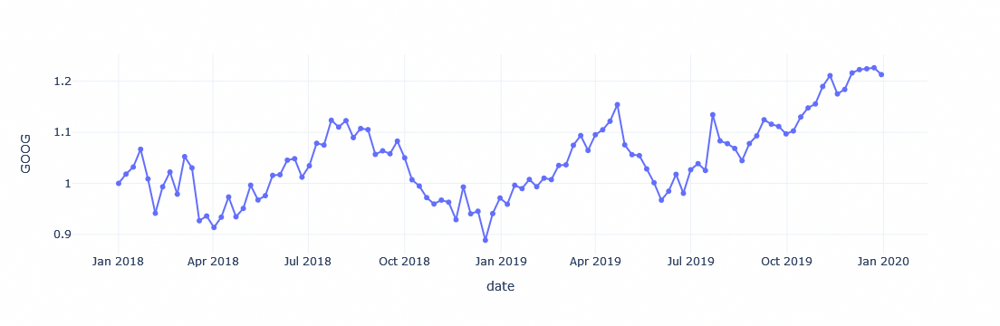

In [40]:
# creating the line chart
line = px.line(df_stocks, x = 'date', y = 'GOOG',
              markers = True)

# remdering the chart
line.show()

### Adding multiple column values to the chart

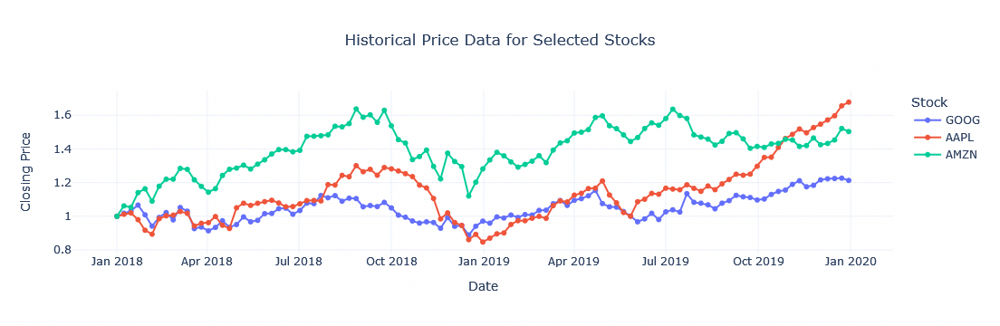

In [42]:
# creating the line chart
line = px.line(df_stocks, x = 'date', y = ['GOOG', 'AAPL', 'AMZN'],
                labels = {'value' : 'Closing Price', 'date':'Date', 'variable':'Stock'},
               title = 'Historical Price Data for Selected Stocks',
              markers = True)

line.update_layout(title_x = 0.5)


# remdering the chart
line.show()

### Changing the colorings

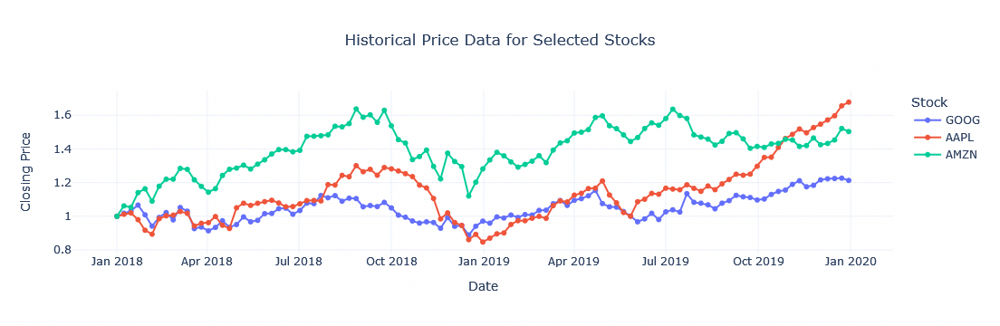

In [15]:
# creating the line chart
line = px.line(df_stocks, x = 'date', y = ['GOOG', 'AAPL', 'AMZN'],
               labels = {'value' : 'Closing Price', 'date':'Date', 'variable':'Stock'},
               title = 'Historical Price Data for Selected Stocks',
              markers = True)

line.update_layout(title_x = 0.5)

# remdering the chart
line.show()

### Faceting into Small Multiples with line charts

In [16]:
df_gap = px.data.gapminder().query('continent =="Europe" and pop > 20e6')

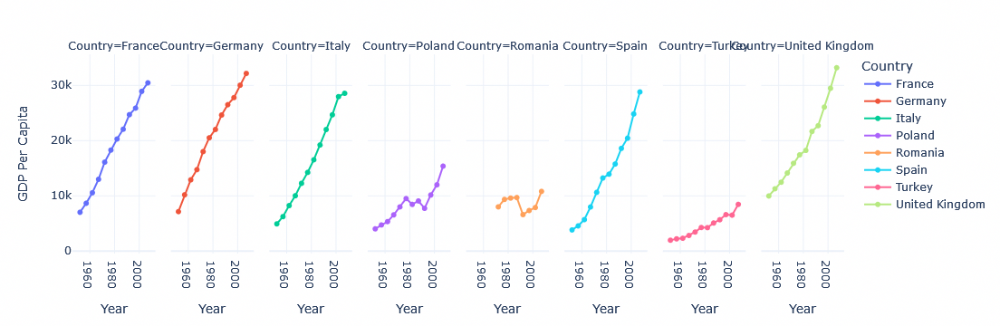

In [22]:
line_gap = px.line(df_gap, x = 'year', y = 'gdpPercap',
               hover_data = {'gdpPercap' : ':.2f'},
               color = 'country',
               markers = True,
                labels = {'gdpPercap':'GDP Per Capita', 'year':'Year', 'country':'Country'},
               facet_col = 'country' # this is what splits it up into small multiples
              )
line_gap.show()

### Organizing the faceting

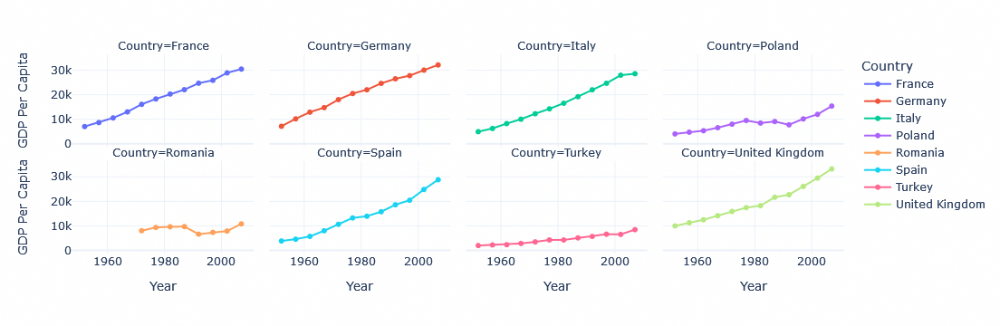

In [30]:
line_gap = px.line(df_gap, x = 'year', y = 'gdpPercap',
               hover_data = {'gdpPercap' : ':.2f'},
               color = 'country',
               markers = True,
                labels = {'gdpPercap':'GDP Per Capita', 'year':'Year', 'country':'Country'},
               facet_col = 'country', # this is what splits it up into small multiples
                facet_col_wrap = 4 # EACH ROW WILL HAVE 4
              )
line_gap.show()

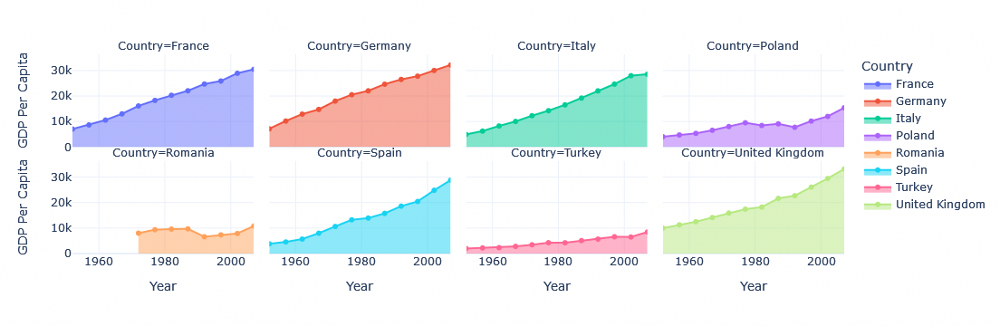

In [31]:
line_gap = px.area(df_gap, x = 'year', y = 'gdpPercap',
               hover_data = {'gdpPercap' : ':.2f'},
               color = 'country',
               markers = True,
                labels = {'gdpPercap':'GDP Per Capita', 'year':'Year', 'country':'Country'},
               facet_col = 'country', # this is what splits it up into small multiples
                facet_col_wrap = 4 # EACH ROW WILL HAVE 4
              )
line_gap.show()

### Removing x-axis title from multiple facets. 

In [33]:
import plotly.graph_objects as go

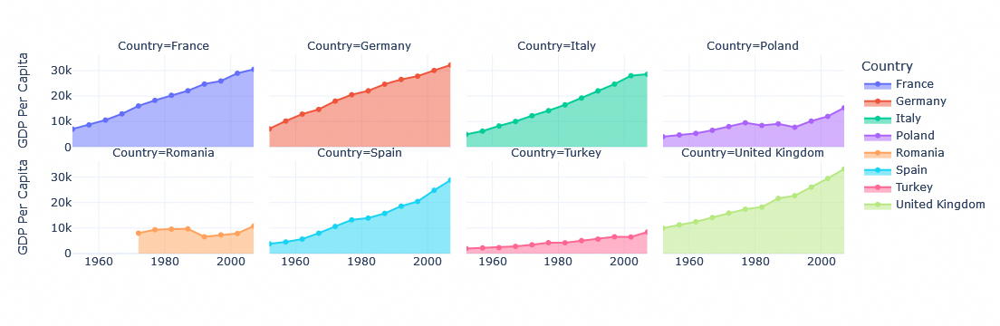

In [38]:
for axis in line_gap.layout:
    if type(line_gap.layout[axis]) == go.layout.XAxis:
        line_gap.layout[axis].title.text = '' # this is where we set it to nothing
line_gap.show()

### Cleaning up the individual graph titles in facets.
This is the final view that is suppose to be very clean looking. 

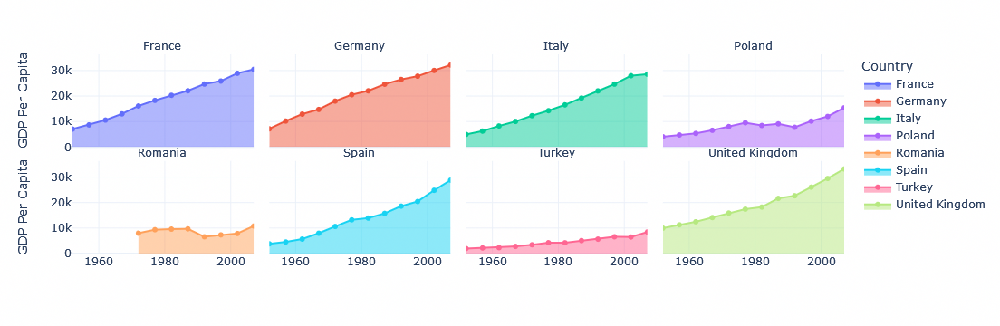

In [39]:
line_gap.for_each_annotation(lambda a: a.update(text=a.text.replace("Country=","")))

line_gap.show()